![NYC Skyline](nyc.jpg)

Welcome to New York City, one of the most-visited cities in the world. There are many Airbnb listings in New York City to meet the high demand for temporary lodging for travelers, which can be anywhere between a few nights to many months. In this project, we will take a closer look at the New York Airbnb market by combining data from multiple file types like `.csv`, `.tsv`, and `.xlsx`.

Recall that **CSV**, **TSV**, and **Excel** files are three common formats for storing data. 
Three files containing data on 2019 Airbnb listings are available to you:

**data/airbnb_price.csv**
This is a CSV file containing data on Airbnb listing prices and locations.
- **`listing_id`**: unique identifier of listing
- **`price`**: nightly listing price in USD
- **`nbhood_full`**: name of borough and neighborhood where listing is located

**data/airbnb_room_type.xlsx**
This is an Excel file containing data on Airbnb listing descriptions and room types.
- **`listing_id`**: unique identifier of listing
- **`description`**: listing description
- **`room_type`**: Airbnb has three types of rooms: shared rooms, private rooms, and entire homes/apartments

**data/airbnb_last_review.tsv**
This is a TSV file containing data on Airbnb host names and review dates.
- **`listing_id`**: unique identifier of listing
- **`host_name`**: name of listing host
- **`last_review`**: date when the listing was last reviewed

In [142]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns

# Begin coding here ...
# Use as many cells as you like

In [143]:
bnb_csv=pd.read_csv(r"C:\Users\Anas Khan\Desktop\EDA Project\EDA-Project-Airbnb-Market-Trends\data\airbnb_price.csv")

In [144]:
bnb_tsv=pd.read_csv(r"C:\Users\Anas Khan\Desktop\EDA Project\EDA-Project-Airbnb-Market-Trends\data\airbnb_last_review.tsv",delimiter="\t")

In [145]:
bnb_excel=pd.read_excel(r"C:\Users\Anas Khan\Desktop\EDA Project\EDA-Project-Airbnb-Market-Trends\data\airbnb_room_type.xlsx")

### Beginner Analysis

In [16]:
bnb_tsv

,listing_id,host_name,last_review
0,2595,Jennifer,May 21 2019
1,3831,LisaRoxanne,July 05 2019
2,5099,Chris,June 22 2019
3,5178,Shunichi,June 24 2019
4,5238,Ben,June 09 2019
...,...,...,...
25204,36425863,Rusaa,July 07 2019
25205,36427429,H Ai,July 07 2019
25206,36438336,Ben,July 07 2019
25207,36442252,Blaine,July 07 2019


In [17]:
#1 
bnb_tsv['last_review']

0         May 21 2019
1        July 05 2019
2        June 22 2019
3        June 24 2019
4        June 09 2019
             ...     
25204    July 07 2019
25205    July 07 2019
25206    July 07 2019
25207    July 07 2019
25208    July 08 2019
Name: last_review, Length: 25209, dtype: object

In [18]:
earliest_review=bnb_tsv['last_review'].min()
earliest_review

'April 01 2019'

In [19]:
most_recent_review=bnb_tsv['last_review'].max()
most_recent_review

'May 31 2019'

In [20]:
# 2 
bnb_excel

,listing_id,description,room_type
0,2595,Skylit Midtown Castle,Entire home/apt
1,3831,Cozy Entire Floor of Brownstone,Entire home/apt
2,5099,Large Cozy 1 BR Apartment In Midtown East,Entire home/apt
3,5178,Large Furnished Room Near B'way,private room
4,5238,Cute & Cozy Lower East Side 1 bdrm,Entire home/apt
...,...,...,...
25204,36425863,Lovely Privet Bedroom with Privet Restroom,PRIVATE ROOM
25205,36427429,No.2 with queen size bed,PRIVATE ROOM
25206,36438336,Seas The Moment,Private room
25207,36442252,1B-1B apartment near by Metro,Entire home/apt


In [21]:
bnb_excel['room_type']

0        Entire home/apt
1        Entire home/apt
2        Entire home/apt
3           private room
4        Entire home/apt
              ...       
25204       PRIVATE ROOM
25205       PRIVATE ROOM
25206       Private room
25207    Entire home/apt
25208       Private room
Name: room_type, Length: 25209, dtype: object

In [22]:
private_room=bnb_excel["room_type"].value_counts()["PRIVATE ROOM"]
private_room

1867

In [23]:
bnb_csv

,listing_id,price,nbhood_full
0,2595,225 dollars,"Manhattan, Midtown"
1,3831,89 dollars,"Brooklyn, Clinton Hill"
2,5099,200 dollars,"Manhattan, Murray Hill"
3,5178,79 dollars,"Manhattan, Hell's Kitchen"
4,5238,150 dollars,"Manhattan, Chinatown"
...,...,...,...
25204,36425863,129 dollars,"Manhattan, Upper East Side"
25205,36427429,45 dollars,"Queens, Flushing"
25206,36438336,235 dollars,"Staten Island, Great Kills"
25207,36442252,100 dollars,"Bronx, Mott Haven"


In [146]:
#3 
bnb_csv['price'] = bnb_csv['price'].str.extract(r'(\d+)')  
bnb_csv['price'] = pd.to_numeric(bnb_csv['price'], errors='coerce')  

In [25]:
avg_price=bnb_csv['price'].mean()

In [26]:
avg_price

141.7779364512674

In [27]:
#4
bnb_csv['avg_price']=avg_price

In [28]:
bnb_tsv['earliest_review']=earliest_review

In [29]:
bnb_tsv['most_recent_review']=most_recent_review

In [30]:
bnb_excel['private_room']=private_room

In [31]:
summary=pd.DataFrame({
    'earliest_review':[earliest_review],
    'most_recent_review':[most_recent_review],
    'avg_price':[avg_price],
    'private_room':[private_room]
})

In [32]:
summary

,earliest_review,most_recent_review,avg_price,private_room
0,April 01 2019,May 31 2019,141.777936,1867


### Intermediate Analysis

In [33]:
#5
bnb_csv

,listing_id,price,nbhood_full,avg_price
0,2595,225,"Manhattan, Midtown",141.777936
1,3831,89,"Brooklyn, Clinton Hill",141.777936
2,5099,200,"Manhattan, Murray Hill",141.777936
3,5178,79,"Manhattan, Hell's Kitchen",141.777936
4,5238,150,"Manhattan, Chinatown",141.777936
...,...,...,...,...
25204,36425863,129,"Manhattan, Upper East Side",141.777936
25205,36427429,45,"Queens, Flushing",141.777936
25206,36438336,235,"Staten Island, Great Kills",141.777936
25207,36442252,100,"Bronx, Mott Haven",141.777936


In [34]:
neighbourhood=bnb_csv.nlargest(5,'price')

In [35]:
neighbourhood

,listing_id,price,nbhood_full,avg_price
23916,34895693,7500,"Brooklyn, East Flatbush",141.777936
22085,33397385,5100,"Manhattan, Midtown",141.777936
18430,30035166,5000,"Manhattan, Harlem",141.777936
21731,33029434,3613,"Manhattan, Upper West Side",141.777936
12508,22263855,3000,"Manhattan, SoHo",141.777936


In [36]:
average_prices = neighbourhood.groupby('nbhood_full')['price'].mean().reset_index()
average_prices.rename(columns={'price': 'avg_price'}, inplace=True)

In [37]:
neighbourhood = neighbourhood.merge(average_prices, on='nbhood_full')

In [38]:
neighbourhood

,listing_id,price,nbhood_full,avg_price_x,avg_price_y
0,34895693,7500,"Brooklyn, East Flatbush",141.777936,7500.0
1,33397385,5100,"Manhattan, Midtown",141.777936,5100.0
2,30035166,5000,"Manhattan, Harlem",141.777936,5000.0
3,33029434,3613,"Manhattan, Upper West Side",141.777936,3613.0
4,22263855,3000,"Manhattan, SoHo",141.777936,3000.0


In [39]:
#6
bnb_excel

,listing_id,description,room_type,private_room
0,2595,Skylit Midtown Castle,Entire home/apt,1867
1,3831,Cozy Entire Floor of Brownstone,Entire home/apt,1867
2,5099,Large Cozy 1 BR Apartment In Midtown East,Entire home/apt,1867
3,5178,Large Furnished Room Near B'way,private room,1867
4,5238,Cute & Cozy Lower East Side 1 bdrm,Entire home/apt,1867
...,...,...,...,...
25204,36425863,Lovely Privet Bedroom with Privet Restroom,PRIVATE ROOM,1867
25205,36427429,No.2 with queen size bed,PRIVATE ROOM,1867
25206,36438336,Seas The Moment,Private room,1867
25207,36442252,1B-1B apartment near by Metro,Entire home/apt,1867


In [54]:
from collections import Counter
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

In [66]:
all_words = bnb_excel['description'].str.lower().str.split().explode()

In [69]:
filtered_words = [word for word in map(str, all_words) if word.isalpha() and word not in ENGLISH_STOP_WORDS]


In [70]:
count=Counter(filtered_words)

In [71]:
common_words=count.most_common(10)

In [72]:
common_words

[('room', 4762),
 ('private', 3974),
 ('bedroom', 3468),
 ('apartment', 2952),
 ('cozy', 2556),
 ('brooklyn', 1933),
 ('studio', 1848),
 ('apt', 1731),
 ('manhattan', 1673),
 ('spacious', 1560)]

### Advanced Analysis

In [73]:
import matplotlib.pyplot as plt
import numpy as np

In [74]:
#7
bnb_excel

,listing_id,description,room_type
0,2595,Skylit Midtown Castle,Entire home/apt
1,3831,Cozy Entire Floor of Brownstone,Entire home/apt
2,5099,Large Cozy 1 BR Apartment In Midtown East,Entire home/apt
3,5178,Large Furnished Room Near B'way,private room
4,5238,Cute & Cozy Lower East Side 1 bdrm,Entire home/apt
...,...,...,...
25204,36425863,Lovely Privet Bedroom with Privet Restroom,PRIVATE ROOM
25205,36427429,No.2 with queen size bed,PRIVATE ROOM
25206,36438336,Seas The Moment,Private room
25207,36442252,1B-1B apartment near by Metro,Entire home/apt


In [75]:
private_room=bnb_excel["room_type"].value_counts()["PRIVATE ROOM"]
priv_avg=private_room.mean()
priv_avg

1867.0

In [76]:
shared_room=bnb_excel["room_type"].value_counts()["SHARED ROOM"]
room_avg=shared_room.mean()
room_avg

97.0

In [77]:
entire_home=bnb_excel["room_type"].value_counts()["Entire home/apt"]
home_avg=entire_home.mean()
home_avg

8458.0

In [78]:
rooms=['priv_avg','room_avg','home_avg']
avg=[1867.0,97.0,8458.0]

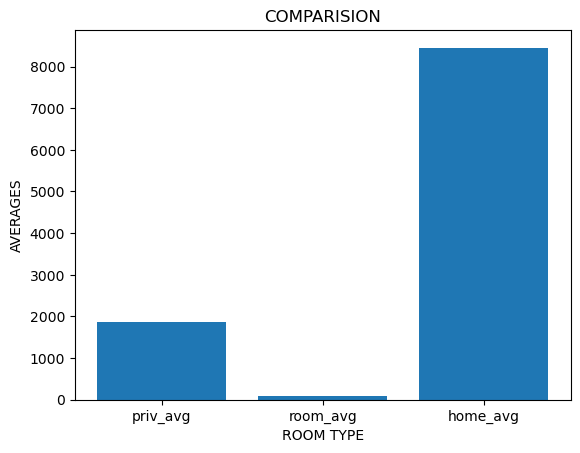

In [79]:
plt.bar(rooms,avg)
plt.title('COMPARISION')
plt.xlabel('ROOM TYPE')
plt.ylabel('AVERAGES')
plt.show()

In [ ]:
#8 
bnb_tsv

In [80]:
bnb_tsv["review_date"]=pd.to_datetime(bnb_tsv['last_review'])

In [81]:
bnb_tsv["Month"]=bnb_tsv["review_date"].dt.to_period("M")

In [82]:
reviews_by_month=bnb_tsv.groupby("Month").size()

In [83]:
reviews_by_month

Month
2019-01     1440
2019-02      470
2019-03      820
2019-04     1456
2019-05     3697
2019-06    12601
2019-07     4725
Freq: M, dtype: int64

In [84]:
months=["JAN","FEB","MARCH","APRIL","MAY","JUNE","JULY"]
reviews=[1440,470,820,1456,3697,12601,4725]

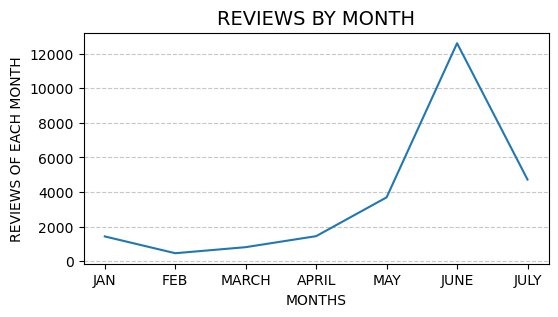

In [85]:
plt.figure(figsize=(6,3))
plt.plot(months,reviews)
plt.title('REVIEWS BY MONTH', fontsize=14)
plt.xlabel('MONTHS')
plt.ylabel('REVIEWS OF EACH MONTH')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [106]:
#9
bnb_excel['description_length'] = bnb_excel['description'].str.len()
data=pd.DataFrame({'price':bnb_csv['price'],
                  'description_len':bnb_excel['description_length']})
data

,price,description_len
0,225,21
1,89,31
2,200,41
3,79,31
4,150,34
...,...,...
25204,129,42
25205,45,24
25206,235,15
25207,100,29


In [107]:
x = data['description_len']
y =data['price']

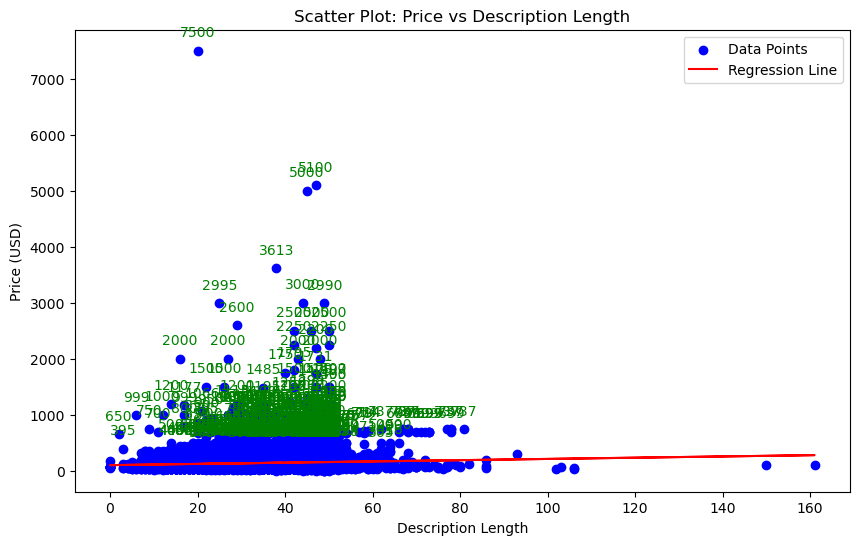

In [111]:
#9
from scipy.stats import linregress
# Regression Line
slope, intercept, *_ = linregress(x, y)
regression_line = slope * x + intercept
plt.figure(figsize=(10, 6))
plt.scatter(x, y, label="Data Points", color="blue")
plt.plot(x, regression_line, label="Regression Line", color="red")

# Step 3: Highlight Outliers
mean_price = y.mean()
std_price = y.std()

# Define outliers (more than 1.5 std from the mean)
outliers = data[(y > mean_price + 1.5 * std_price) | (y < mean_price - 1.5 * std_price)]

# Annotate outliers
for _, row in outliers.iterrows():
    plt.annotate(f"{row['price']}", (row['description_len'], row['price']), 
                 textcoords="offset points", xytext=(0, 10), ha='center', color="green")

# Final Plot Settings
plt.xlabel("Description Length")
plt.ylabel("Price (USD)")
plt.title("Scatter Plot: Price vs Description Length")
plt.legend()
plt.show()

In [121]:
#10
import seaborn as sns
df=pd.DataFrame({'price':bnb_csv['price'],
                'nbhood':bnb_csv['nbhood_full'],
                'room_type':bnb_excel['room_type']})

C:\Users\Anas Khan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Anas Khan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\Anas Khan\AppData\Local\Temp\ipykernel_7780\2670109708.py:15: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


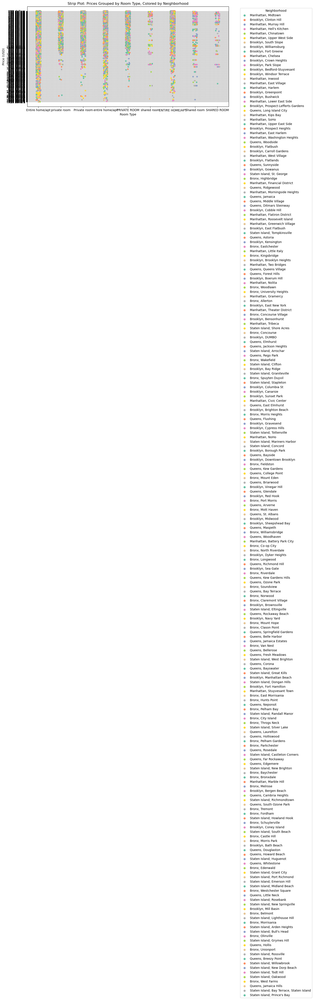

In [122]:
plt.figure(figsize=(12, 6))
sns.stripplot(
    data=df,
    x='room_type',
    y='price',
    hue='nbhood',   # Use hue to distinguish neighborhoods
    jitter=True,         # Add jitter to avoid overlapping
    palette='Set2'       # Use a predefined color palette
)
plt.title("Strip Plot: Prices Grouped by Room Type, Colored by Neighborhood")
plt.xlabel("Room Type")
plt.ylabel("Price (USD)")
plt.legend(title="Neighborhood", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

### Visualization questions

In [130]:
#11
room_type_counts = bnb_excel['room_type'].value_counts()

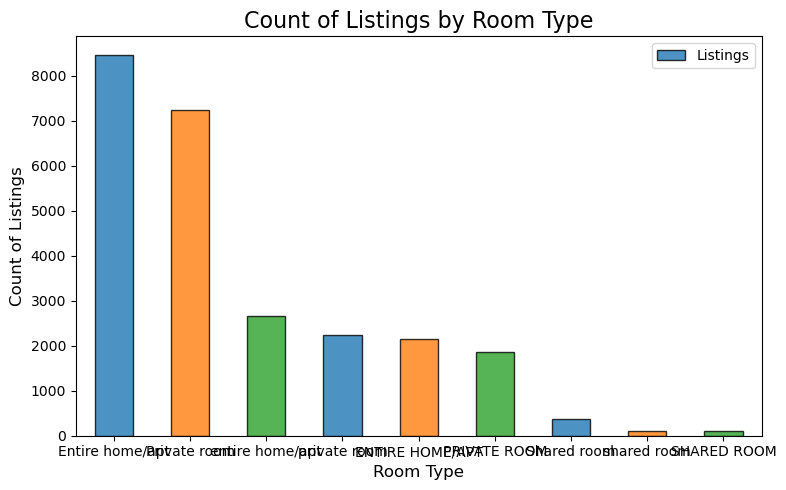

In [131]:
plt.figure(figsize=(8, 5))
room_type_counts.plot(kind='bar', color=['#1f77b4', '#ff7f0e', '#2ca02c'], alpha=0.8, edgecolor='black')
plt.title('Count of Listings by Room Type', fontsize=16)
plt.xlabel('Room Type', fontsize=12)
plt.ylabel('Count of Listings', fontsize=12)
plt.xticks(rotation=0)  
plt.legend(['Listings'], loc='upper right')
plt.tight_layout()
plt.show()

In [132]:
#12
bnb_tsv['review_count'] = bnb_tsv.groupby('listing_id')['last_review'].transform('count')
data=bnb_tsv[['listing_id', 'review_count']]
df=pd.DataFrame(data)
print(df)

       listing_id  review_count
0            2595             1
1            3831             1
2            5099             1
3            5178             1
4            5238             1
...           ...           ...
25204    36425863             1
25205    36427429             1
25206    36438336             1
25207    36442252             1
25208    36455809             1

[25209 rows x 2 columns]


C:\Users\Anas Khan\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


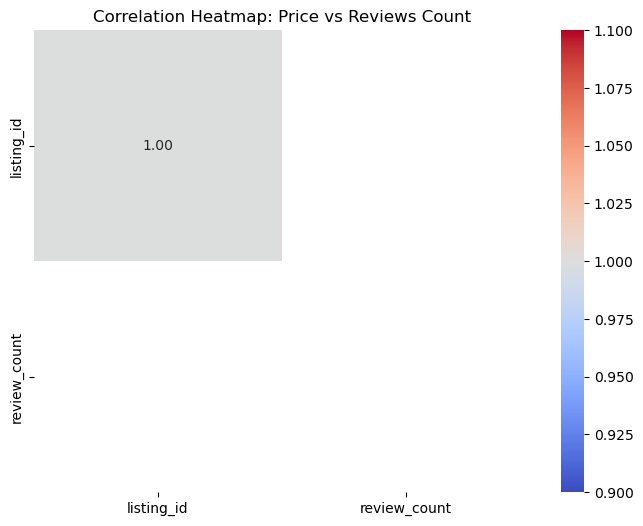

In [129]:
correlation_matrix = df.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(
    correlation_matrix,
    annot=True,      # Display correlation values on the heatmap
    cmap="coolwarm", # Color palette
    fmt=".2f",       # Format the correlation values
    cbar=True        # Show color bar
)

# Step 3: Customize Plot
plt.title("Correlation Heatmap: Price vs Reviews Count")
plt.show()

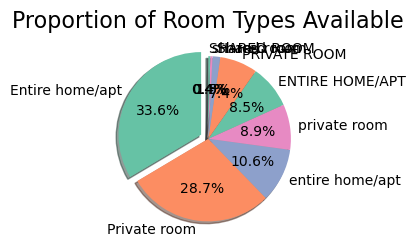

In [133]:
#13
plt.figure(figsize=(4, 4))
colors = ['#66c2a5', '#fc8d62', '#8da0cb', '#e78ac3']
plt.pie(
    room_type_counts, 
    labels=room_type_counts.index,  # Room types as labels
    autopct='%1.1f%%',  # Display percentages
    startangle=90,      # Rotate for better layout
    colors=colors,      # Custom colors
    explode=[0.1 if i == 0 else 0 for i in range(len(room_type_counts))],  # Highlight the first slice
    shadow=True         # Add shadow for depth
)
plt.title('Proportion of Room Types Available', fontsize=16)
plt.tight_layout()
plt.show()

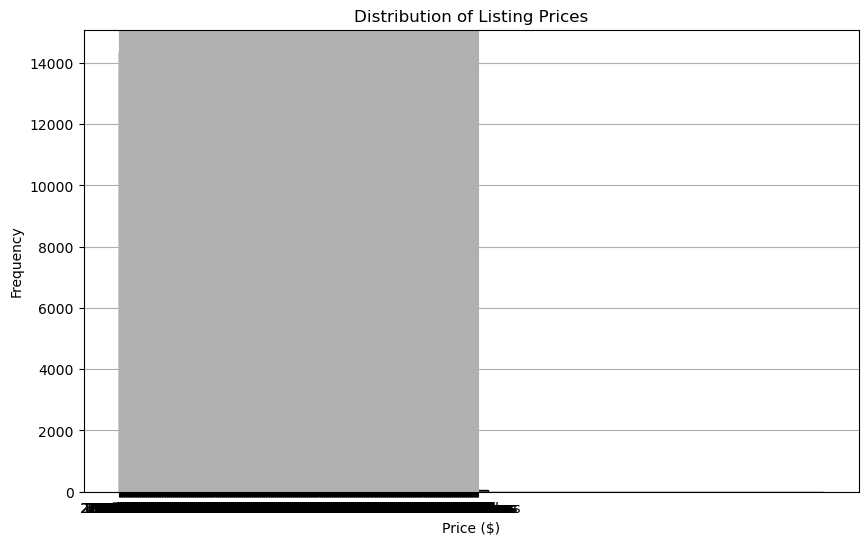

In [137]:
#14
plt.figure(figsize=(10, 6))
plt.hist(bnb_csv['price'], bins=range(0, 1100, 50), edgecolor='black')  # Bins in increments of 50
plt.title('Distribution of Listing Prices')
plt.xlabel('Price ($)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

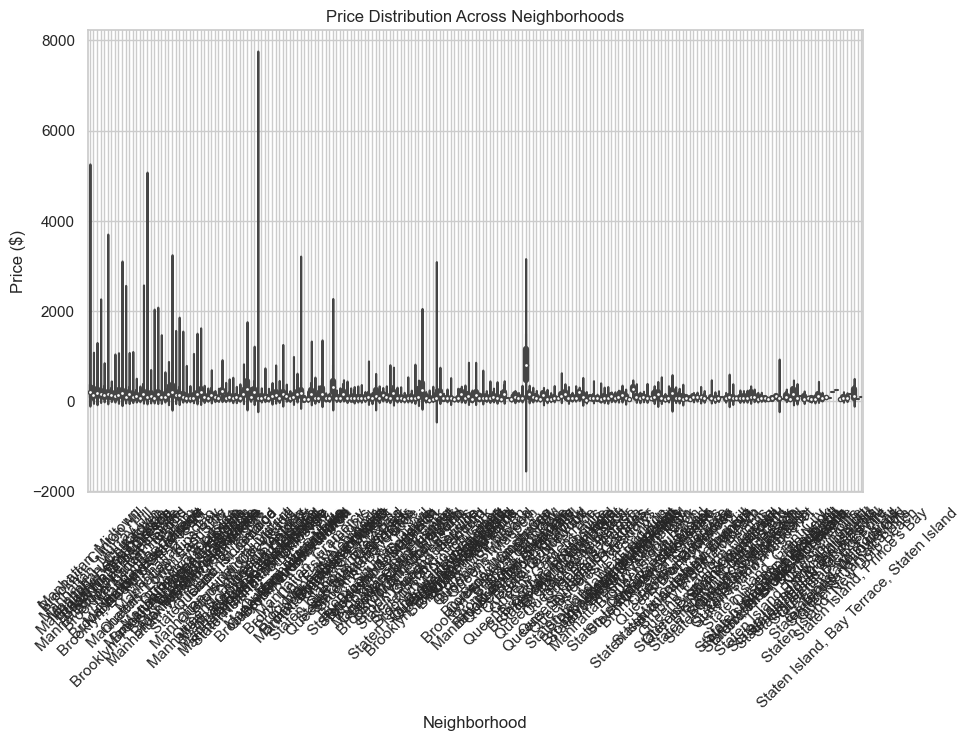

In [157]:
#15
import seaborn
df=pd.DataFrame({"neighbourhood":bnb_csv['nbhood_full'],
                "price":bnb_csv['price']})
# Set Seaborn style
sns.set(style="whitegrid")

# Create the violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='neighbourhood', y='price', data=df)

# Customize the plot
plt.title('Price Distribution Across Neighborhoods')
plt.xlabel('Neighborhood')
plt.ylabel('Price ($)')
plt.xticks(rotation=45)  # Rotate the x-axis labels if needed
plt.grid(True)

# Show the plot
plt.show()

### Bonus questions

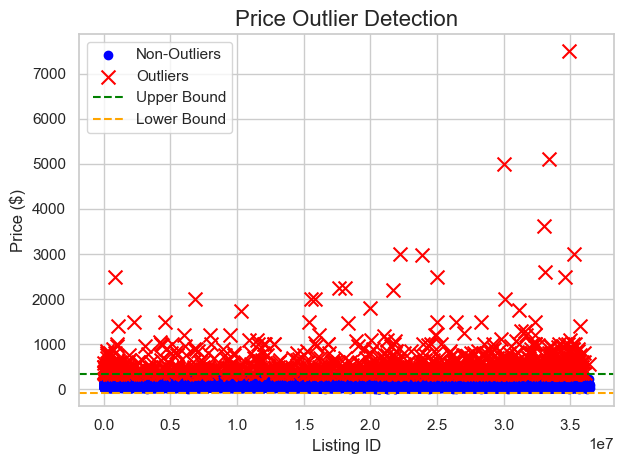

In [161]:
#1
bnb_csv['price'] = pd.to_numeric(bnb_csv['price'], errors='coerce')
Q1 = bnb_csv['price'].quantile(0.25)  
Q3 = bnb_csv['price'].quantile(0.75)  
IQR = Q3 - Q1 
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = bnb_csv[bnb_csv['price'] > upper_bound]
non_outliers = bnb_csv[bnb_csv['price'] <= upper_bound]
# Plot non-outliers
plt.scatter(non_outliers['listing_id'], non_outliers['price'], 
            color='blue', label='Non-Outliers')

# Plot outliers
plt.scatter(outliers['listing_id'], outliers['price'], 
            color='red', label='Outliers', marker='x', s=100)

# Add labels, title, and legend
plt.title('Price Outlier Detection', fontsize=16)
plt.xlabel('Listing ID', fontsize=12)
plt.ylabel('Price ($)', fontsize=12)
plt.axhline(upper_bound, color='green', linestyle='--', label='Upper Bound')
plt.axhline(lower_bound, color='orange', linestyle='--', label='Lower Bound')
plt.legend()
plt.tight_layout()
plt.show()



In [158]:
import plotly.express as px

In [159]:
gp=pd.DataFrame({"price":bnb_csv['price'],
                 "neighbourhood":bnb_csv['nbhood_full'],
                 "room_type":bnb_excel['room_type'],
                 "description":bnb_excel['description']})

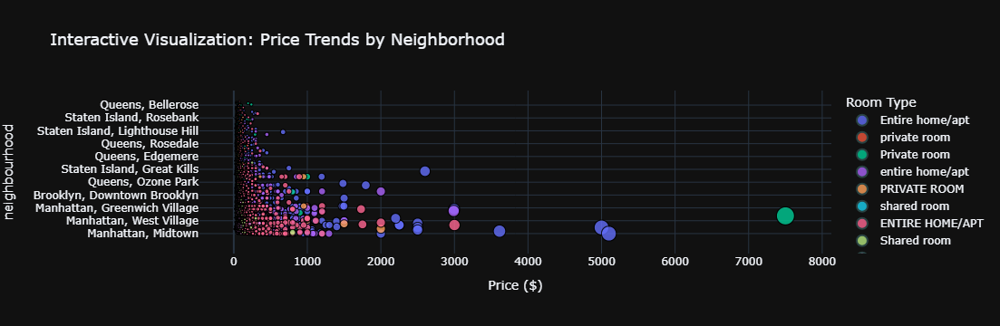

In [160]:
fig = px.scatter(
    gp,
    x='price',  # Neighborhoods on x-axis
    y='neighbourhood',         # Prices on y-axis
    color='room_type', # Different colors for each room type
    size='price',      # Bubble size represents price
    hover_data=['description', 'room_type'],  # Tooltip info
    title='Interactive Visualization: Price Trends by Neighborhood',
    labels={'price': 'Price ($)', 'neighbourhood': 'neighbourhood'},
    template='plotly_dark'  # Optional: Dark theme for better visuals
)
fig.update_traces(marker=dict(opacity=0.8, line=dict(width=1, color='DarkSlateGray')))
fig.update_layout(
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14,
    legend_title_text='Room Type'
)
fig.show()